<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/iportfolio/images/logos/kuleuven.png/@@images/image-800-e89431243530c6a800aa1186b9f6891b.png" width=auto height=200px align=left>
</div>

# KUL H02A5a Computer Vision — Group Assignment 1

**Team 27** | Fosteris Emmanouil · Paschalidis Marios · Greiner Luc · Reyes Salazar Jose · Digenis Stefanos

---

### Notebook structure

| Section | Content |
|---------|---------|
| 0 | Data loading & preprocessing |
| 1 | Feature representations (HOG, PCA) |
| 2 | Evaluation metrics |
| 3 | Classifiers |
| 4 | Experiments |
| 5 | Best results & submission |
| 6 | Discussion |

> **Helper modules** (imported below):
> - `face_detection.py` — HAARPreprocessor, DNNFaceDetector
> - `preprocessing.py`  — face_to_gray, HOG/PCA helpers, train/val split
> - `visualize.py`       — all plotting functions
> - `annotate.py`       — all data annotations functions


## Imports

In [55]:
import os

# Specific path to the Assignment_1 directory
#os.chdir('Assignment_1') 

print("Now in:", os.getcwd())

Now in: /Users/morrow/Documents/KU Leuven/CV/Computer-Vision-Assignments/Assignment_1


In [56]:
import sys
import time
import os, math, shutil, threading
from concurrent.futures import ThreadPoolExecutor, as_completed

import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC, LinearSVC
from skimage.feature import hog
import joblib

# Local modules
from face_detection  import DNNFaceDetector, HAARPreprocessor, run_preprocessing
from preprocessing   import (face_to_gray, convert_crops_to_gray, extract_hog_batch,
                              flatten_images, normalize_per_image, apply_pca,
                              get_train_val_split, summarize_dataset, save_crops)
from visualize       import (plot_class_distribution, plot_class_grid, plot_face_debug,
                              plot_image_sequence, plot_hog_features, plot_tsne,
                              plot_eigenfaces, plot_explained_variance,
                              plot_pca_reconstruction, plot_pca_scatter,
                              plot_validation_images, plot_confusion_matrix)


---
# 0. Data Loading & Preprocessing


## 0.1 Load data

The training set is intentionally small (80 images) relative to the test set (1816 images).
This mirrors a real-world scenario: a model trained on a handful of labelled examples must
generalise to daily production traffic.

The dataset is a subset of the [VGG Face Dataset](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/)
and contains four people:

| Person | Class label | # images |
|--------|-------------|----------|
| Jesse Eisenberg | 1 | 30 |
| Mila Kunis | 2 | 30 |
| Michael Cera (Jesse lookalike) | 0 | 10 |
| Sarah Hyland (Mila lookalike) | 0 | 10 |

Michael and Sarah are intentionally included to test whether the classifier can distinguish
the target person from someone who looks similar.


In [57]:
train = pd.read_csv('datasets/train_set.csv', index_col=0)
train.index = train.index.rename('id')

test = pd.read_csv('datasets/test_set.csv', index_col=0)
test.index = test.index.rename('id')

# Load raw images as RGB numpy arrays
train['img'] = [cv2.cvtColor(np.load(f'datasets/train/train_{i}.npy', allow_pickle=False),
                              cv2.COLOR_BGR2RGB) for i, _ in train.iterrows()]
test['img']  = [cv2.cvtColor(np.load(f'datasets/test/test_{i}.npy',  allow_pickle=False),
                              cv2.COLOR_BGR2RGB) for i, _ in test.iterrows()]

print(f"Training set : {len(train)} images")
print(f"Test set     : {len(test)}  images")
train.head(1)

Training set : 80 images
Test set     : 1816  images


,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


## 0.2 Exploratory analysis

Before preprocessing, we inspect the class distribution and basic image statistics.
This confirms the class imbalance (Jesse/Mila have 3× more images than the lookalikes)
and checks whether images have consistent dimensions.


                 img  class
name                       
Jesse_Eisenberg   30      1
Michael_Cera      10      0
Mila_Kunis        30      2
Sarah_Hyland      10      0


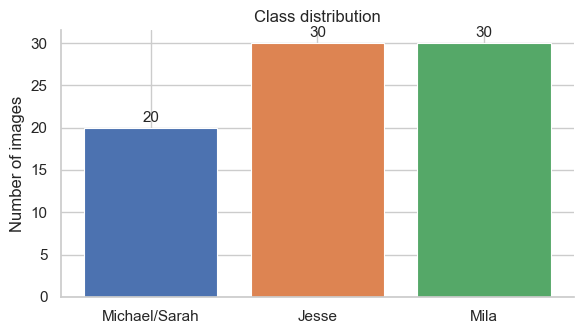

In [58]:
# Class distribution
print(train.groupby('name').agg({'img': 'count', 'class': 'max'}))
plot_class_distribution(train['class'].values, class_names={0:'Michael/Sarah',1:'Jesse',2:'Mila'})

In [59]:
# Image size statistics — check for dimension variation before choosing FACE_SIZE
train['h'] = train['img'].apply(lambda x: x.shape[0])
train['w'] = train['img'].apply(lambda x: x.shape[1])
train['aspect'] = train['w'] / train['h']
train[['h', 'w', 'aspect']].describe().round(2)

,h,w,aspect
count,80.00,80.00,80.00
mean,494.22,420.74,0.93
std,276.21,189.10,0.38
min,168.00,198.00,0.57
25%,360.00,300.00,0.67
50%,447.00,393.50,0.74
75%,594.00,480.00,1.06
max,2304.00,1536.00,2.08


## 0.3 Face detection & preprocessing

Raw images contain backgrounds, clothing, and sometimes multiple people.
We must isolate just the face region before extracting features — otherwise HOG and PCA
will describe the scene rather than the person.

### Approach: HAAR vs DNN

We evaluated two OpenCV face detectors:

| Detector | Mechanism | False positives | Group shots |
|----------|-----------|-----------------|-------------|
| **HAAR** cascade | Hand-crafted edge filters | Many (shirts, walls) — required 7 post-filters | Struggles — no confidence score |
| **DNN** ResNet-SSD | Learned CNN features | Almost none — model rejects non-faces internally | Better — confidence score breaks ties |

**We use DNN for all experiments.** HAAR is kept for comparison in section 4.

Both detectors feed into the same scoring function:

```
score = confidence² × face_area × centre_weight × sharpness
```

- `confidence²`: DNN certainty, squared to make high-confidence detections dominate
- `face_area`: fraction of image covered — rewards prominent subjects
- `centre_weight`: Gaussian decay from rule-of-thirds target (35% from top) — portrait framing bias
- `sharpness`: Laplacian variance of the crop — foreground subjects are always sharper than background faces


In [60]:
# Global constants used throughout the notebook
FACE_SIZE   = (100, 100)
TARGET_SIZE = (64, 64)     # HOG/PCA input size
CLASS_NAMES = {0: 'Michael/Sarah', 1: 'Jesse', 2: 'Mila'}

# Run both detectors — results are cached so subsequent runs load from disk
train_X_dnn,  train_y_dnn,  test_X  = run_preprocessing(
    train, test, detector='dnn',  face_size=FACE_SIZE,
    model_path='tmp', cache_path='dnn_prepped_data'
)

train_X_haar, train_y_haar, test_X_haar = run_preprocessing(
    train, test, detector='haar', face_size=FACE_SIZE,
    model_path='tmp', cache_path='haar_prepped_data'
)

Loading cached arrays from 'dnn_prepped_data' ...
  train_X: (80, 100, 100, 3)  train_y: (80,)  test_X: (1816, 100, 100, 3)
Loading cached arrays from 'haar_prepped_data' ...
  train_X: (80, 100, 100, 3)  train_y: (80,)  test_X: (1816, 100, 100, 3)


## 0.4 Verify extracted faces

We visually inspect the extracted crops for each class to confirm the detector is
selecting the correct person.  The debug plot shows the original image alongside its
extracted face crop so mis-detections are immediately obvious.

**Known limitations (documented here for the TAs):**

- ~4 Jesse images contain Michael Cera at similar size and position — both detectors
  pick the wrong person because the other face scores higher on area + sharpness.
  These 4 samples (~5% of Jesse's training data) are accepted as label noise;
  classifiers trained on real-world data routinely handle this level of noise.
- One Mila image (HP billboard) returns no face — the center-crop fallback is used.


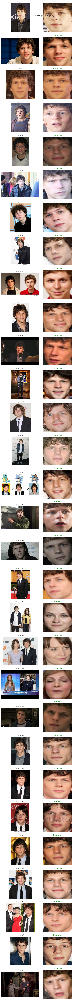

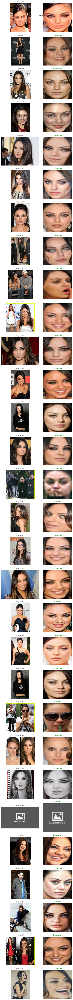

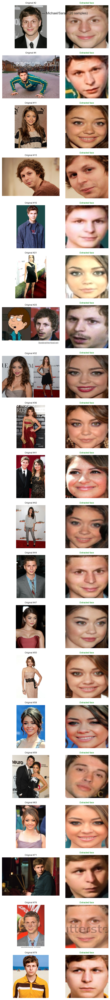

In [61]:
# Debug visualization of DNN crops — change class_id to 0, 1, or 2
# Inspect DNN crops — change class_id to 0, 1, or 2
for class_id in [1, 2, 0]:
    n = int((train_y_dnn == class_id).sum())
    plot_face_debug(train, train_X_dnn, train_y_dnn,
                    class_id=class_id, n=n, class_names=CLASS_NAMES)

In [62]:
# Quick dataset summary — confirms shapes and flags any remaining NaN crops
summarize_dataset(train_X_dnn, train_y_dnn, class_names=CLASS_NAMES)

Dataset summary:
  Total samples : 80
  Image shape   : (100, 100, 3)
  dtype         : float32
  NaN crops     : 0
  Class counts  :
    0 — Michael/Sarah: 20
    1 — Jesse: 30
    2 — Mila: 30


In [63]:
from annotate import FaceAnnotator
import json

In [64]:
train_X_dnn_original = train_X_dnn.copy()

annotator = FaceAnnotator(
    train_df         = train,
    face_array       = train_X_dnn.copy(),
    label_array      = train_y_dnn.copy(),
    annotations_path = "manual_annotations.json"
)

train_X_final, train_y_final = annotator.build_final_dataset(
    train_df    = train,
    face_size   = FACE_SIZE,
    output_dir  = "final_train_extracted_faces",
)

# delete the non found image
train_X_final = np.delete(train_X_final, 65, axis=0)
train_y_final = np.delete(train_y_final, 65, axis=0)

np.save(os.path.join('final_train_extracted_faces', "test_X.npy"), test_X)

  Loaded 7 existing annotations from 'manual_annotations.json'.
FaceAnnotator ready.
  80 images loaded.
  7 annotations found in 'manual_annotations.json'.
apply_corrections: replaced 7 crops.
  Added crop from image #18 — class 0 (Michael_Sarah)
  Added crop from image #32 — class 0 (Michael_Sarah)
  Added crop from image #32 — class 0 (Michael_Sarah)
  Added crop from image #34 — class 0 (Michael_Sarah)
  Added crop from image #77 — class 2 (Mila)
  Added crop from image #77 — class 2 (Mila)

expand_dataset: 80 → 86 samples (+6 crops from 4 images)

build_final_dataset complete → 'final_train_extracted_faces/'
  Total crops : 86
  By source   : {'dnn': 73, 'corrected': 7, 'multi_annotation': 6}
  By class    : {np.int64(0): np.int64(24), np.int64(1): np.int64(30), np.int64(2): np.int64(32)}
    Michael_Sarah/  (24 images)
    Jesse/  (30 images)
    Mila/  (32 images)


Corrected images : [18, 41, 49, 52, 53, 59, 61]
Multi-face images: [18, 32, 34, 77]


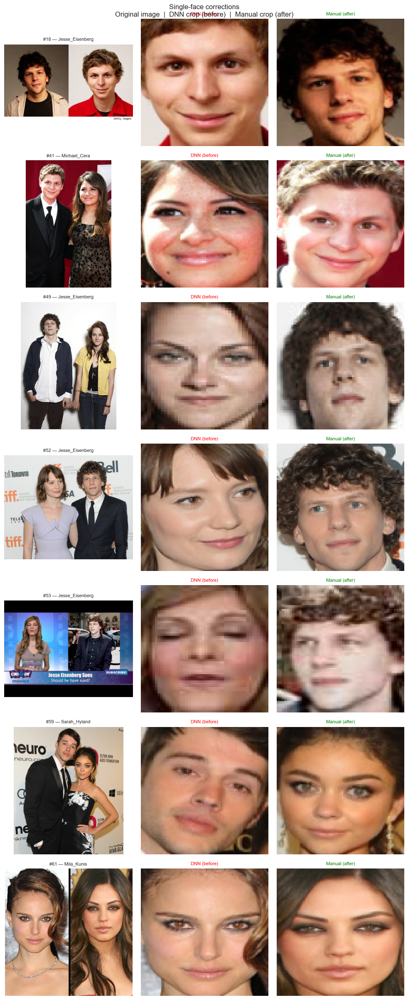

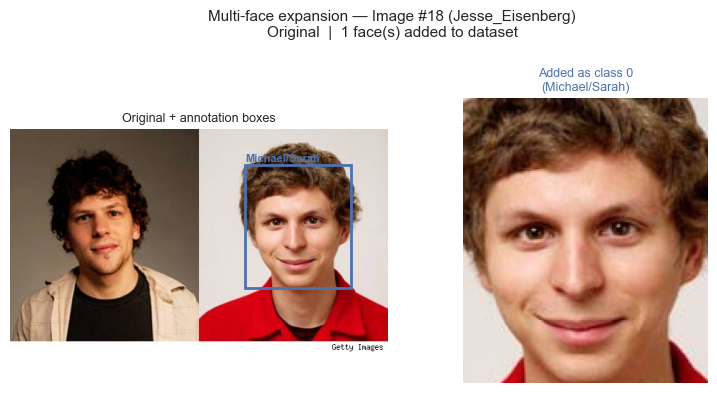

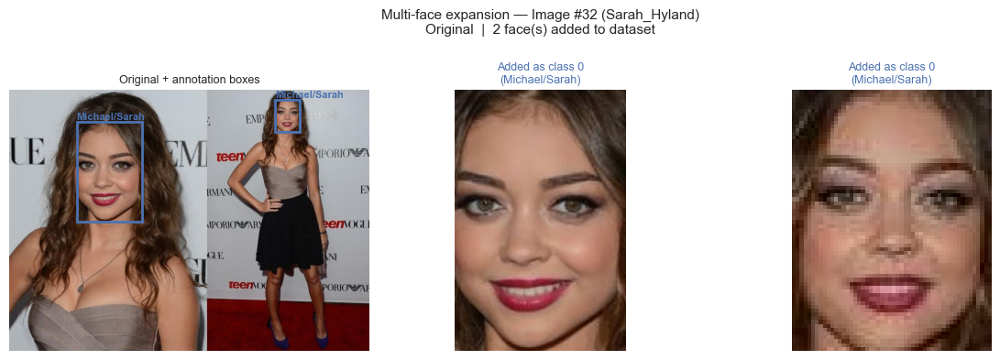

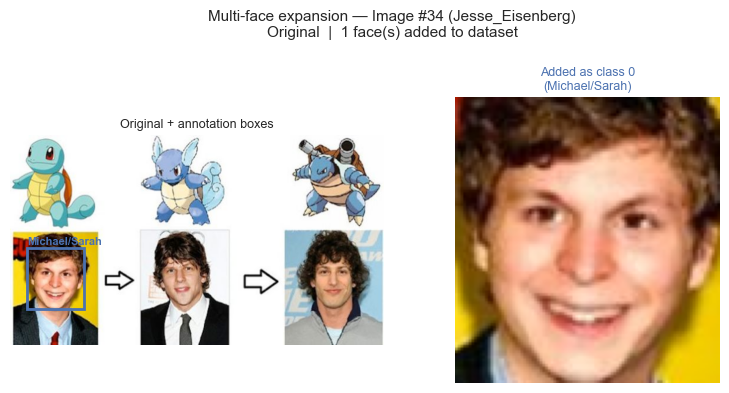

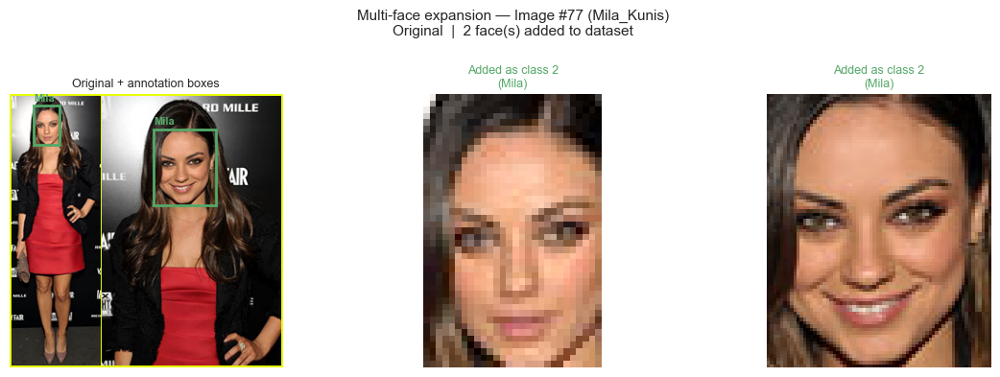

In [65]:
annotator.plot_annotation_summary(
    train_df             = train,
    train_X_dnn_original = train_X_dnn_original,
    train_X_final        = train_X_final,
    train_y_final        = train_y_final,
)

In [66]:
# Global constants used throughout the notebook
FACE_SIZE   = (100, 100)
TARGET_SIZE = (64, 64)     # HOG/PCA input size
CLASS_NAMES = {0: 'Michael/Sarah', 1: 'Jesse', 2: 'Mila'}

In [67]:
X_train_crops, X_val_crops, y_train, y_val = get_train_val_split(
    train_X_final, labels=train_y_final,
    test_size=0.15, random_state=42,
)[:4]

get_train_val_split:
  Total samples  : 85
  Training       : 72
  Validation     : 13
  Train dist     : {np.int64(0): np.int64(20), np.int64(1): np.int64(26), np.int64(2): np.int64(26)}
  Val   dist     : {np.int64(0): np.int64(4), np.int64(1): np.int64(4), np.int64(2): np.int64(5)}


In [68]:
train_X_gray = np.stack([cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2GRAY) for img in train_X_final])
test_X_gray = np.stack([cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2GRAY) for img in test_X])

train_X_flat = train_X_gray.reshape(train_X_gray.shape[0], -1)
test_X_flat = test_X_gray.reshape(test_X_gray.shape[0], -1)

---
# 1. Feature Representations

A good feature representation must be both **robust** (same features extracted from
the same person under different conditions) and **discriminative** (different people
are easily separated in feature space).

We explore two paradigms:
- **Handcrafted**: HOG — encodes local gradient structure
- **Learned from data**: PCA / Eigenfaces — learns axes of maximum variation from the training set


## 1.0 Identity feature extractor (baseline)

In [69]:
class IdentityFeatureExtractor:
    """
    Baseline extractor — returns the raw input unchanged.
    Used with the random classifier in section 4.0 to establish a
    performance floor before any real feature engineering.
    """
    def transform(self, X): return X
    def __call__(self, X):  return self.transform(X)

## 1.1 Handcrafted features: HOG

**Histogram of Oriented Gradients (HOG)** computes the distribution of gradient
directions in local image regions.  It captures edge structure (eye sockets, nose
bridge, jawline) while being robust to small lighting changes through block-level
L2 normalisation.

### Parameter choices

| Parameter | Value | Reason |
|-----------|-------|--------|
| `orientations` | 9 | Standard — covers 0–180° in 20° bins |
| `pixels_per_cell` | (8, 8) | Captures fine facial structure; smaller → noisier, larger → loses detail |
| `cells_per_block` | (2, 2) | 2×2 cells per normalisation block; removes local lighting artefacts |
| `block_norm` | L2-Hys | Lowe's clipped L2 norm — best practice for face tasks |
| Input size | 64×64 | Standard HOG input; produces 1764-dim feature vector |

The input is always converted to **grayscale** — color adds no information for identity
classification and triples computation.  Conversion is handled by `face_to_gray` from
`preprocessing.py` which also manages NaN sentinel crops from failed detections.


In [70]:
class HOGFeatureExtractor(IdentityFeatureExtractor):
    """
    Histogram of Oriented Gradients feature extractor with configurable
    preprocessing and optional training-time augmentation.

    Parameters
    ----------
    orientations   : number of gradient direction bins (default 9)
                     covers 0–180° — more bins capture finer edge directions
                     but increase feature vector length
    pixels_per_cell: (width, height) of each HOG cell in pixels (default (8,8))
                     smaller → finer detail, larger feature vector, more noise
                     larger  → coarser features, smaller vector, more robust
    cells_per_block : (width, height) of normalisation block in cells (default (2,2))
                     local L2 normalisation within each block makes features
                     robust to local illumination changes
    target_size    : grayscale input size (width, height), default (64, 64)
    preprocessing  : list of preprocessing steps to apply before HOG
                     options: 'clahe', 'equalize', 'denoise'
                     default: ['clahe'] — best for face images with varied lighting
    color_hog      : if True, compute HOG on each RGB channel separately
                     and concatenate — 3× longer vector but captures color edges
                     default: False — color adds little for identity classification
    augment        : if True, randomly augment during transform (for training only)
                     applies random horizontal flip + brightness jitter
                     default: False — set True when fitting the classifier,
                              False when transforming val/test
    """

    _VALID_PREPROCESSING = {"clahe", "equalize", "denoise"}

    def __init__(
        self,
        orientations:    int   = 9,
        pixels_per_cell: tuple = (8, 8),
        cells_per_block: tuple = (2, 2),
        target_size:     tuple = (64, 64),
        preprocessing:   list  = None,
        color_hog:       bool  = False,
        augment:         bool  = False,
    ):
        self.target_size     = target_size
        self.color_hog       = color_hog
        self.augment         = augment
        self.preprocessing   = preprocessing if preprocessing is not None else ["clahe"]

        # Validate preprocessing options
        unknown = set(self.preprocessing) - self._VALID_PREPROCESSING
        if unknown:
            raise ValueError(f"Unknown preprocessing steps: {unknown}. "
                             f"Choose from {self._VALID_PREPROCESSING}")

        self.params = {
            "orientations":    orientations,
            "pixels_per_cell": pixels_per_cell,
            "cells_per_block": cells_per_block,
            "block_norm":      "L2-Hys",
            "visualize":       False,
        }

        # CLAHE object — created once and reused
        # self._clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

        # Compute feature vector length once
        self._feature_length = self._compute_feature_length()

    # ------------------------------------------------------------------
    # Properties
    # ------------------------------------------------------------------

    @property
    def feature_length(self) -> int:
        """Length of the feature vector produced by transform()."""
        return self._feature_length

    def _compute_feature_length(self) -> int:
        """Computes feature vector length by running on a dummy image."""
        dummy = np.zeros(
            (self.target_size[1], self.target_size[0]), dtype=np.uint8
        )
        channels = 3 if self.color_hog else 1
        single   = len(hog(dummy, **self.params))
        return single * channels

    # ------------------------------------------------------------------
    # Preprocessing chain
    # ------------------------------------------------------------------

    def _apply_preprocessing(self, gray: np.ndarray) -> np.ndarray:
        """
        Applies the configured preprocessing steps in order.

        CLAHE (Contrast Limited Adaptive Histogram Equalisation):
            Enhances local contrast in tiles rather than globally — avoids
            amplifying noise in uniform regions (skin). Superior to plain
            histogram equalisation for face images.

        equalize:
            Global histogram equalisation — simpler than CLAHE, useful as a
            baseline comparison. Can over-amplify noise in smooth regions.

        denoise:
            Gaussian blur (σ=0.8) — removes high-frequency sensor noise that
            creates false gradient responses. Very mild, preserves edge structure.
        """
        result = gray.copy()

        for step in self.preprocessing:
            if step == "clahe":
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                result = clahe.apply(result)
            elif step == "equalize":
                result = cv2.equalizeHist(result)
            elif step == "denoise":
                result = cv2.GaussianBlur(result, (3, 3), sigmaX=0.8)

        return result

    # ------------------------------------------------------------------
    # Augmentation
    # ------------------------------------------------------------------

    def _augment(self, gray: np.ndarray) -> np.ndarray:
        """
        Applies random augmentation to increase effective training set size.

        Horizontal flip (50% chance):
            Faces are roughly horizontally symmetric — flipping creates a valid
            second training example. Important when we have only 60–80 samples.

        Brightness jitter (uniform ±20% of pixel range):
            Simulates different lighting conditions. Multiplies pixel values by
            a random factor in [0.8, 1.2], then clips to [0, 255].
        """
        if np.random.rand() < 0.5:
            gray = np.fliplr(gray)

        factor = np.random.uniform(0.8, 1.2)
        gray   = np.clip(gray.astype(np.float32) * factor, 0, 255).astype(np.uint8)

        return gray

    # ------------------------------------------------------------------
    # Core transform
    # ------------------------------------------------------------------

    def _extract_single(self, img_array: np.ndarray) -> np.ndarray:
        """
        Extracts HOG features from one image (no augmentation).
        Used internally and for visualization.
        """
        # Convert to gray via face_to_gray — handles NaN, dtype, resize
        if img_array.ndim == 2:
            img_array = np.repeat(
                img_array[:, :, np.newaxis], 3, axis=2
            ).astype(np.float32)

        if self.color_hog:
            # Run HOG on each RGB channel separately
            img_uint8 = np.clip(img_array, 0, 255).astype(np.uint8)
            img_resized = cv2.resize(
                img_uint8,
                self.target_size,
                interpolation=cv2.INTER_AREA
            )
            features = []
            for ch in range(3):
                channel = self._apply_preprocessing(img_resized[:, :, ch])
                features.append(hog(channel, **self.params))
            return np.concatenate(features).astype(np.float32)
        else:
            gray = face_to_gray(img_array, target_size=self.target_size)
            gray = self._apply_preprocessing(gray)
            return hog(gray, **self.params).astype(np.float32)

    def transform(self, img_array: np.ndarray) -> np.ndarray:
        """
        Extracts HOG features from a single image.

        If self.augment is True (set during training), applies random
        horizontal flip and brightness jitter before feature extraction.

        Parameters
        ----------
        img_array : face crop (H, W, 3) float32 RGB, or (H, W) grayscale

        Returns
        -------
        np.ndarray of shape (feature_length,), float32
        """
        if img_array.ndim == 2:
            img_array = np.repeat(
                img_array[:, :, np.newaxis], 3, axis=2
            ).astype(np.float32)

        if self.augment and not self.color_hog:
            # Augmentation on grayscale before HOG
            gray = face_to_gray(img_array, target_size=self.target_size)
            gray = self._apply_preprocessing(gray)
            gray = self._augment(gray)
            return hog(gray, **self.params).astype(np.float32)

        return self._extract_single(img_array)

    def get_hog_image(self, img_array: np.ndarray):
        """
        Returns (gray_img, hog_visualization) for plotting.
        Always uses grayscale regardless of color_hog setting.
        """
        if img_array.ndim == 2:
            img_array = np.repeat(
                img_array[:, :, np.newaxis], 3, axis=2
            ).astype(np.float32)

        gray = face_to_gray(img_array, target_size=self.target_size)
        gray = self._apply_preprocessing(gray)

        _, hog_img = hog(
            gray, **{**self.params, "visualize": True}
        )
        return gray, hog_img

    # ------------------------------------------------------------------
    # Documentation
    # ------------------------------------------------------------------

    def describe(self) -> None:
        """Prints a full parameter and feature vector summary."""
        h, w         = self.target_size[1], self.target_size[0]
        pcy, pcx     = self.params["pixels_per_cell"]
        bcy, bcx     = self.params["cells_per_block"]
        n_cells_x    = w // pcx
        n_cells_y    = h // pcy
        n_blocks_x   = n_cells_x - bcx + 1
        n_blocks_y   = n_cells_y - bcy + 1
        single_len   = (self.params["orientations"]
                        * bcx * bcy * n_blocks_x * n_blocks_y)
        channels     = 3 if self.color_hog else 1

        print("HOGFeatureExtractor configuration")
        print("=" * 42)
        print(f"  Input size       : {w}×{h} px (grayscale)")
        print(f"  Orientations     : {self.params['orientations']}")
        print(f"  Pixels per cell  : {self.params['pixels_per_cell']}")
        print(f"  Cells per block  : {self.params['cells_per_block']}")
        print(f"  Block norm       : {self.params['block_norm']}")
        print(f"  Preprocessing    : {self.preprocessing}")
        print(f"  Color HOG        : {self.color_hog}")
        print(f"  Augmentation     : {self.augment}")
        print("─" * 42)
        print(f"  Grid             : {n_cells_x}×{n_cells_y} cells")
        print(f"  Blocks           : {n_blocks_x}×{n_blocks_y}")
        print(f"  Feature length   : {single_len} × {channels} ch "
              f"= {self.feature_length} dims")

In [71]:
def evaluate_extractor(extractor, X_train_crops, y_train, X_val_crops, y_val):
    """
    Extracts HOG features then fits a fixed SVM and returns val accuracy.
    Uses 5-fold CV on training set so val set is never seen during fitting.
    """
    extractor.augment = True
    X_tr = extract_hog_batch(X_train_crops, extractor, verbose=False)

    extractor.augment = False
    X_va = extract_hog_batch(X_val_crops,   extractor, verbose=False)

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("svm",    SVC(kernel="rbf", C=10, gamma="scale", random_state=42))
    ])

    # 5-fold CV accuracy on training set
    cv    = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(pipe, X_tr, y_train, cv=cv, scoring="accuracy")

    # Val accuracy
    pipe.fit(X_tr, y_train)
    val_acc = accuracy_score(y_val, pipe.predict(X_va))

    return {
        "cv_mean":    cv_scores.mean(),
        "cv_std":     cv_scores.std(),
        "val_acc":    val_acc,
        "feat_len":   X_tr.shape[1],
    }

### 1.1.1 HOG feature visualisation

The HOG image shows the dominant gradient direction in each cell.
For a valid face crop we expect to see structure around the eyes, nose, and mouth.
If the HOG image looks noisy or uniform, the face crop was a false positive.


In [72]:
configs = [
    # ── Baseline ─────────────────────────────────────────────────────────────
    {
        "name":            "Baseline (8px, 9 ori, CLAHE)",
        "pixels_per_cell": (8, 8),
        "orientations":    9,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # ── A. pixels_per_cell ───────────────────────────────────────────────────
    # Small cells (4px): 16×16 grid — captures fine detail like eyelashes,
    # lip edges. But very sensitive to alignment noise and generates a 7056-dim
    # vector — risk of overfitting with 60-70 training samples.
    {
        "name":            "A1. Fine cells (4px)",
        "pixels_per_cell": (4, 4),
        "orientations":    9,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # Large cells (16px): 4×4 grid — coarse face structure only (head shape,
    # eye region). Very compact vector (144 dims) but loses facial fine detail.
    # Likely to confuse Jesse and Michael who differ mainly in subtle features.
    {
        "name":            "A2. Coarse cells (16px)",
        "pixels_per_cell": (16, 16),
        "orientations":    9,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # ── B. orientations ──────────────────────────────────────────────────────
    # Fewer bins (6): 30° resolution — may miss diagonal edges (e.g. jawline
    # slope) that are important for identity. Faster but less discriminative.
    {
        "name":            "B1. Fewer orientations (6)",
        "pixels_per_cell": (8, 8),
        "orientations":    6,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # More bins (12): 15° resolution — captures very fine edge angles.
    # Diminishing returns vs 9 bins; can overfit to pose variation.
    {
        "name":            "B2. More orientations (12)",
        "pixels_per_cell": (8, 8),
        "orientations":    12,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # ── C. preprocessing ─────────────────────────────────────────────────────
    # No preprocessing: raw grayscale — establishes whether CLAHE actually
    # helps. If baseline beats this, CLAHE is earning its keep.
    {
        "name":            "C1. No preprocessing",
        "pixels_per_cell": (8, 8),
        "orientations":    9,
        "preprocessing":   [],
        "color_hog":       False,
    },

    # Equalise only: global contrast stretch — simpler than CLAHE.
    # Tends to over-amplify noise in smooth skin regions.
    {
        "name":            "C2. Global equalise",
        "pixels_per_cell": (8, 8),
        "orientations":    9,
        "preprocessing":   ["equalize"],
        "color_hog":       False,
    },

    # CLAHE + denoise: removes sensor noise before CLAHE to prevent
    # noise from being amplified into false edges.
    {
        "name":            "C3. CLAHE + denoise",
        "pixels_per_cell": (8, 8),
        "orientations":    9,
        "preprocessing":   ["denoise", "clahe"],
        "color_hog":       False,
    },

    # ── D. color HOG ─────────────────────────────────────────────────────────
    # Runs HOG on R, G, B separately and concatenates — 3× longer vector.
    # For identity classification color rarely helps (Jesse and Michael
    # have similar skin tone) but may help Mila vs Jesse (different complexion).
    {
        "name":            "D1. Color HOG",
        "pixels_per_cell": (8, 8),
        "orientations":    9,
        "preprocessing":   ["clahe"],
        "color_hog":       True,
    },

    # ── E. Combined best guesses ──────────────────────────────────────────────
    # Fine cells + more orientations: highest detail, highest risk of overfit
    {
        "name":            "E1. Fine + more ori",
        "pixels_per_cell": (4, 4),
        "orientations":    12,
        "preprocessing":   ["clahe"],
        "color_hog":       False,
    },

    # Coarser cells + CLAHE+denoise: robust to noise, compact
    {
        "name":            "E2. Coarse + denoise+clahe",
        "pixels_per_cell": (16, 16),
        "orientations":    9,
        "preprocessing":   ["denoise", "clahe"],
        "color_hog":       False,
    },
]

# ── Run all configurations ───────────────────────────────────────────────────
print("Running HOG configuration experiments...\n")
results = []

for cfg in configs:
    hog_ext = HOGFeatureExtractor(
        orientations    = cfg["orientations"],
        pixels_per_cell = cfg["pixels_per_cell"],
        cells_per_block = (2, 2),
        target_size     = TARGET_SIZE,
        preprocessing   = cfg["preprocessing"],
        color_hog       = cfg["color_hog"],
        augment         = False,
    )
    metrics = evaluate_extractor(hog_ext, X_train_crops, y_train, X_val_crops, y_val)
    row = {"config": cfg["name"], **metrics}
    results.append(row)
    print(f"  {cfg['name']:<38} "
          f"CV: {metrics['cv_mean']*100:.1f}% ±{metrics['cv_std']*100:.1f}%  "
          f"Val: {metrics['val_acc']*100:.1f}%  "
          f"Dims: {metrics['feat_len']}")

results_df = pd.DataFrame(results).sort_values("cv_mean", ascending=False)

Running HOG configuration experiments...

  Baseline (8px, 9 ori, CLAHE)           CV: 79.0% ±6.6%  Val: 76.9%  Dims: 1764
  A1. Fine cells (4px)                   CV: 68.1% ±5.3%  Val: 69.2%  Dims: 8100
  A2. Coarse cells (16px)                CV: 76.2% ±7.7%  Val: 92.3%  Dims: 324
  B1. Fewer orientations (6)             CV: 78.9% ±14.3%  Val: 92.3%  Dims: 1176
  B2. More orientations (12)             CV: 80.5% ±8.1%  Val: 76.9%  Dims: 2352
  C1. No preprocessing                   CV: 79.2% ±8.5%  Val: 92.3%  Dims: 1764
  C2. Global equalise                    CV: 75.0% ±7.4%  Val: 92.3%  Dims: 1764
  C3. CLAHE + denoise                    CV: 76.4% ±10.6%  Val: 84.6%  Dims: 1764
  D1. Color HOG                          CV: 75.0% ±3.0%  Val: 84.6%  Dims: 5292
  E1. Fine + more ori                    CV: 66.6% ±5.7%  Val: 76.9%  Dims: 10800
  E2. Coarse + denoise+clahe             CV: 77.6% ±5.7%  Val: 100.0%  Dims: 324


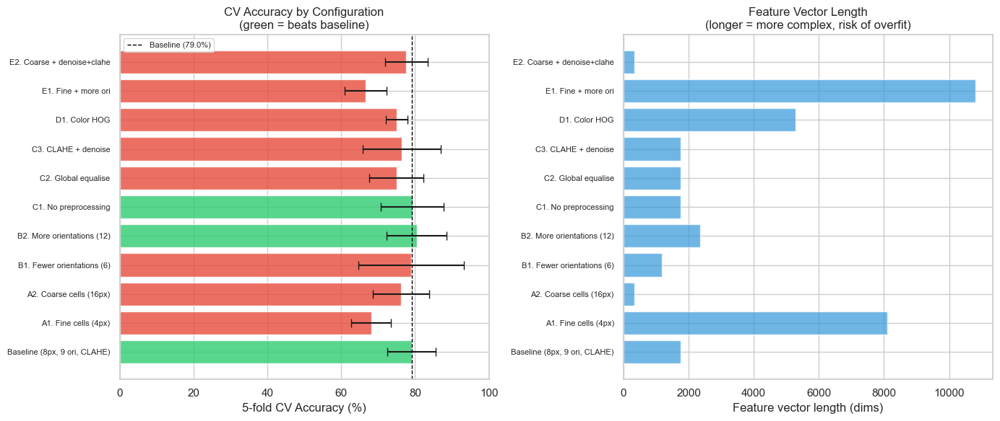


Full results table:
                      config  cv_mean   cv_std  val_acc  feat_len
  B2. More orientations (12) 0.804762 0.081148 0.769231      2352
        C1. No preprocessing 0.792381 0.084628 0.923077      1764
Baseline (8px, 9 ori, CLAHE) 0.790476 0.066257 0.769231      1764
  B1. Fewer orientations (6) 0.788571 0.142971 0.923077      1176
  E2. Coarse + denoise+clahe 0.776190 0.057459 1.000000       324
         C3. CLAHE + denoise 0.763810 0.106462 0.846154      1764
     A2. Coarse cells (16px) 0.761905 0.076724 0.923077       324
               D1. Color HOG 0.750476 0.029601 0.846154      5292
         C2. Global equalise 0.749524 0.073500 0.923077      1764
        A1. Fine cells (4px) 0.680952 0.053452 0.692308      8100
         E1. Fine + more ori 0.665714 0.057175 0.769231     10800


In [73]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

names    = [r["config"] for r in results]
cv_means = [r["cv_mean"] * 100 for r in results]
cv_stds  = [r["cv_std"]  * 100 for r in results]
val_accs = [r["val_acc"] * 100 for r in results]
feat_lens = [r["feat_len"] for r in results]

# Baseline index for reference line
baseline_cv = results[0]["cv_mean"] * 100

y_pos = range(len(names))

# Left: CV accuracy with error bars
axes[0].barh(y_pos, cv_means, xerr=cv_stds,
             color=["#2ecc71" if v >= baseline_cv else "#e74c3c" for v in cv_means],
             alpha=0.8, capsize=4)
axes[0].axvline(baseline_cv, color="black", linestyle="--",
                linewidth=1, label=f"Baseline ({baseline_cv:.1f}%)")
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(names, fontsize=8)
axes[0].set_xlabel("5-fold CV Accuracy (%)")
axes[0].set_title("CV Accuracy by Configuration\n(green = beats baseline)")
axes[0].legend(fontsize=8)
axes[0].set_xlim(0, 100)

# Right: feature vector length (complexity proxy)
axes[1].barh(y_pos, feat_lens, color="#3498db", alpha=0.7)
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(names, fontsize=8)
axes[1].set_xlabel("Feature vector length (dims)")
axes[1].set_title("Feature Vector Length\n(longer = more complex, risk of overfit)")

plt.tight_layout()
plt.show()

print("\nFull results table:")
print(results_df.to_string(index=False))

In [74]:
# =============================================================================
# Select best configuration based on CV results
# =============================================================================
best_config_name = results_df.iloc[0]["config"]
best_config      = next(c for c in configs if c["name"] == best_config_name)

print(f"Best configuration: {best_config_name}")
print(f"  CV accuracy : {results_df.iloc[0]['cv_mean']*100:.1f}% "
      f"±{results_df.iloc[0]['cv_std']*100:.1f}%")
print(f"  Val accuracy: {results_df.iloc[0]['val_acc']*100:.1f}%")
print(f"  Feature dims: {results_df.iloc[0]['feat_len']}")

# Rebuild extractor with best config for rest of notebook
hog_extractor = HOGFeatureExtractor(
    orientations    = best_config["orientations"],
    pixels_per_cell = best_config["pixels_per_cell"],
    cells_per_block = (2, 2),
    target_size     = TARGET_SIZE,
    preprocessing   = best_config["preprocessing"],
    color_hog       = best_config["color_hog"],
    augment         = False,
)
hog_extractor.describe()

# Re-extract features with best config for SVM tuning in next section
hog_extractor.augment = True
train_hog_features = extract_hog_batch(train_X_final, hog_extractor, verbose=False)

hog_extractor.augment = False
test_hog_features  = extract_hog_batch(test_X, hog_extractor, verbose=False)

print(f"\nFinal HOG features: train={train_hog_features.shape}  "
      f"test={test_hog_features.shape}")

Best configuration: B2. More orientations (12)
  CV accuracy : 80.5% ±8.1%
  Val accuracy: 76.9%
  Feature dims: 2352
HOGFeatureExtractor configuration
  Input size       : 64×64 px (grayscale)
  Orientations     : 12
  Pixels per cell  : (8, 8)
  Cells per block  : (2, 2)
  Block norm       : L2-Hys
  Preprocessing    : ['clahe']
  Color HOG        : False
  Augmentation     : False
──────────────────────────────────────────
  Grid             : 8×8 cells
  Blocks           : 7×7
  Feature length   : 2352 × 1 ch = 2352 dims

Final HOG features: train=(85, 2352)  test=(1816, 2352)


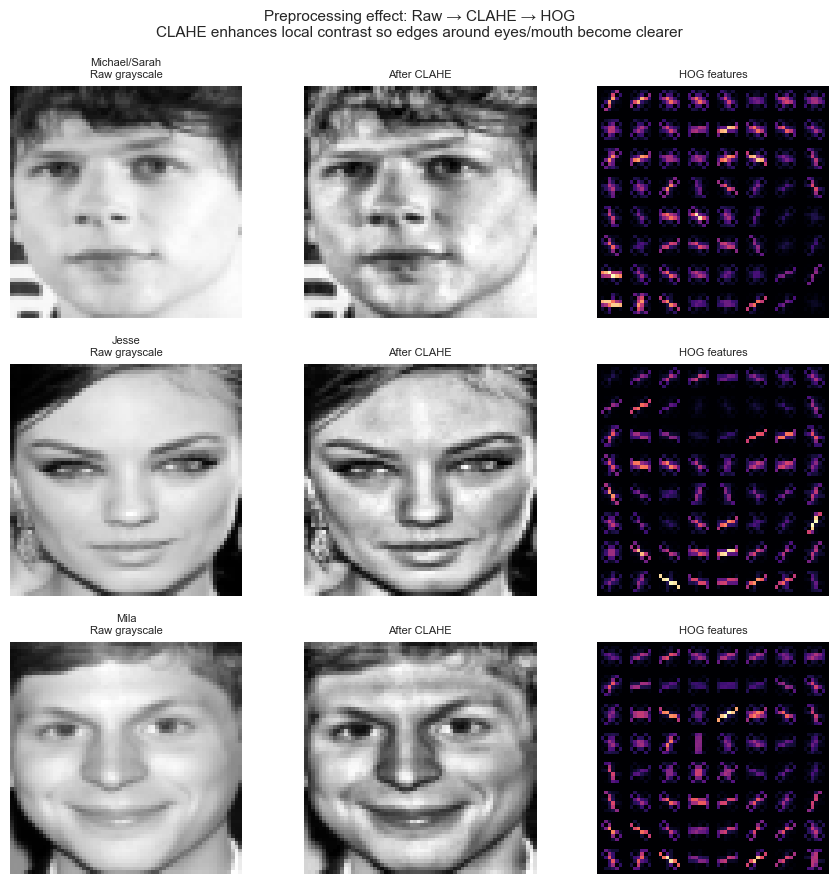

In [75]:
fig, axes = plt.subplots(3, 3, figsize=(9, 9))
class_ids  = [1, 2, 0]
row_labels = list(CLASS_NAMES.values())

for row, class_id in enumerate(class_ids):
    # Pick first valid sample for this class
    idx      = np.where(train_y_final == class_id)[0][0]
    img_crop = train_X_final[idx]

    # Raw gray (no preprocessing)
    raw_gray = face_to_gray(img_crop, target_size=TARGET_SIZE)

    # CLAHE-enhanced gray
    clahe_gray = hog_extractor._apply_preprocessing(raw_gray)

    # HOG visualization (uses CLAHE internally)
    _, hog_img = hog_extractor.get_hog_image(img_crop)

    axes[row, 0].imshow(raw_gray,   cmap="gray")
    axes[row, 0].set_title(f"{row_labels[row]}\nRaw grayscale", fontsize=8)
    axes[row, 0].axis("off")

    axes[row, 1].imshow(clahe_gray, cmap="gray")
    axes[row, 1].set_title("After CLAHE", fontsize=8)
    axes[row, 1].axis("off")

    axes[row, 2].imshow(hog_img,    cmap="magma")
    axes[row, 2].set_title("HOG features", fontsize=8)
    axes[row, 2].axis("off")

fig.suptitle(
    "Preprocessing effect: Raw → CLAHE → HOG\n"
    "CLAHE enhances local contrast so edges around eyes/mouth become clearer",
    fontsize=11
)
plt.tight_layout()
plt.show()

### 1.1.2 t-SNE plot

t-SNE projects the 1764-dimensional HOG vectors to 2D so we can visually assess
whether the features are **discriminative** (classes form separate clusters) and
**robust** (same class forms a tight cluster despite image variation).

We use `perplexity=10` because with only 80 training samples the default of 30 is
too large — it would force every point to be considered a neighbour of every other.


Extracting HOG features...
  Train HOG : (85, 2352)  (feature vector = 2352 dims)
  Test  HOG : (1816, 2352)
Running t-SNE (perplexity=10) on (85, 2352) ...


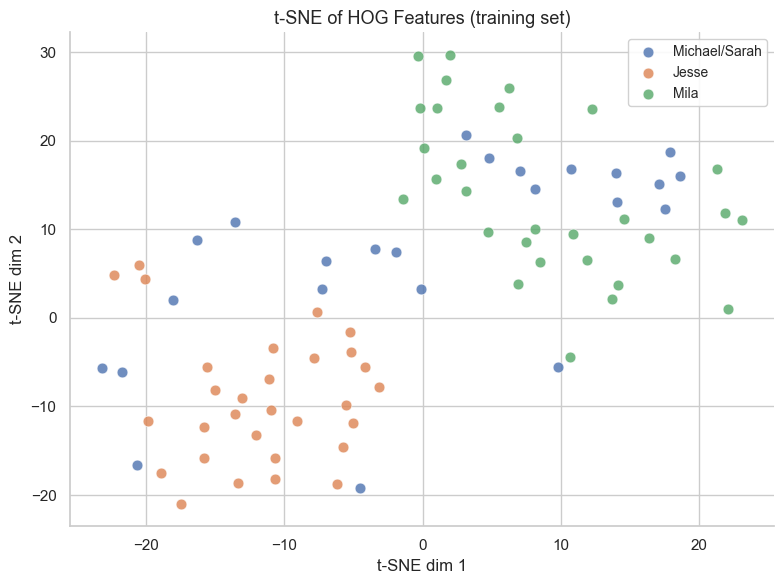

In [76]:
print("Extracting HOG features...")

hog_extractor.augment = True
train_hog_features = np.array([hog_extractor._extract_single(x) for x in train_X_final])

hog_extractor.augment = True
test_hog_features  = np.array([hog_extractor._extract_single(x) for x in test_X])

print(f"  Train HOG : {train_hog_features.shape}  "
      f"(feature vector = {hog_extractor.feature_length} dims)")
print(f"  Test  HOG : {test_hog_features.shape}")

# t-SNE — assesses discriminability of HOG features
# Well-separated clusters = HOG captures class-specific facial structure
plot_tsne(
    features    = train_hog_features,
    label_array = train_y_final,
    title       = "t-SNE of HOG Features (training set)",
    class_names = CLASS_NAMES,
    perplexity  = 10,
)

In [77]:
from pathlib import Path
Path("final_data").mkdir(parents=True, exist_ok=True)

In [78]:
np.save(os.path.join('final_data', "final_train_hog_features.npy"), train_hog_features)
np.save(os.path.join('final_data', "final_test_hog_features.npy"), test_hog_features)
np.save(os.path.join('final_data', "final_train_labels.npy"), train_y_final)

joblib.dump(hog_extractor, 'final_data/hog_extractor.pkl')

['final_data/hog_extractor.pkl']

### 1.1.3. Discussion
lore ipsum

## 1.2 PCA Feature Extractor

We use the class `PCAFeatureExtractor` to extract eigenface features from the face images.

**`fit(X)`**: Subtracts the mean face from every image so that the data is centered around zero. This is a required step before applying SVD, as PCA assumes the data is mean-centered. It then applies Singular Value Decomposition and stores the S vector (which contains the singular values, related to the eigenvalues of the covariance matrix) and the Vt matrix (whose rows are the principal components, i.e. the eigenfaces).

**`transform(X)`**: Projects images into the reduced PCA space by centering them with the same mean face and multiplying by the first `n_components` eigenfaces. Each image is represented as a compact feature vector of `n_components` values instead of thousands of pixels.

**`inverse_transform(X_projected)`**: Reconstructs images from their PCA representation back to pixel space by multiplying the coefficients by the eigenfaces and adding the mean face back. This is useful for visualizing how much information is retained at different numbers of components.

In [79]:
class PCAFeatureExtractor(IdentityFeatureExtractor):
    def __init__(self, n_components):
        self.n_components = n_components

    def fit(self, X):
        self.mean_face = X.mean(axis=0)
        X_centered = X - self.mean_face
        U, self.S, self.Vt = np.linalg.svd(X_centered, full_matrices=False)

    def transform(self, X):
        return (X - self.mean_face) @ self.Vt[:self.n_components, :].T

    def inverse_transform(self, X_projected):
        return X_projected @ self.Vt[:self.n_components, :] + self.mean_face

### Scree Plot and Choosing the Number of Components

To determine how many principal components to retain, we analyze how much variance each component explains. The singular values from SVD tell us this. Specifically, the squared singular values are proportional to the eigenvalues of the covariance matrix. By dividing each squared singular value by the total sum, we get the percentage of variance explained by each component.

We plot these values in a scree plot and look for the "elbow", the point where the curve flattens and additional components stop contributing meaningful information. We also compute the cumulative variance of the first 20 components to verify that we retain enough of the total variance for classification.

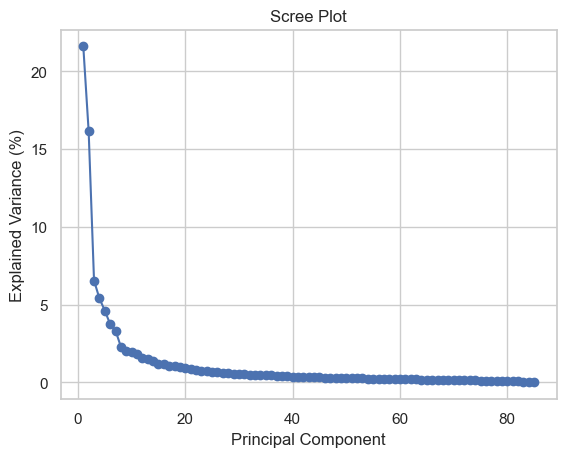

First 20 PCs explain: 80.16%


In [80]:
pca_extractor = PCAFeatureExtractor(n_components=20)
pca_extractor.fit(train_X_flat)

squared_s = pca_extractor.S ** 2
explained_var = squared_s / squared_s.sum() * 100

plt.plot(range(1, len(explained_var) + 1), explained_var, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.title('Scree Plot')
plt.show()

print(f"First 20 PCs explain: {np.sum(explained_var[:20]):.2f}%")

### Interpretation

The scree plot shows a clear elbow around 5-8 components, after which the individual contributions flatten out significantly. The first component alone explains about 22% of the variance, and the first two together account for nearly 38%. Beyond the first 10 components, each additional component contributes less than 2%.

The first 20 principal components explain 79.87% of the total variance. In the classification section, we will experiment with different values of p to find the optimal number of components for our task.

Note that the total number of non-zero eigenvalues is 85 (one less than our 86 training images), since mean centering removes one degree of freedom from the data.

### 1.2.1. Eigenface Plots

### Eigenface Reconstructions

To visualize how much information is retained at different numbers of principal components, we reconstruct a single face image using an increasing number of eigenfaces (p = 1, 5, 10, 20, 40, 60, 75).

With p=1, the reconstruction is essentially the mean face with a slight adjustment in one direction of variation, the identity of the person is unrecognizable. By p=5, some facial structure begins to emerge. At p=10, the general shape and features become visible, and by p=20, the face is clearly recognizable as a specific individual. Beyond p=40, the added components contribute finer details such as skin texture and hair strands, but the identity is already well captured at p=20.

This supports our choice of retaining 20 principal components: the essential information needed for face recognition is already present, while the additional components mostly capture high-frequency details and noise that are less useful for classification.

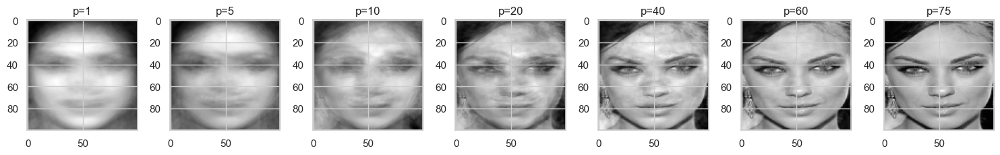

In [81]:
p = [1, 5, 10, 20, 40, 60, 75]
fig, axes = plt.subplots(1, len(p), figsize=(15, 4))
for i, p_val in enumerate(p):
    pca_temp = PCAFeatureExtractor(n_components=p_val)
    pca_temp.fit(train_X_flat)
    coefficients = pca_temp.transform(train_X_flat[0:1])
    reconstruction = pca_temp.inverse_transform(coefficients)
    axes[i].imshow(reconstruction.reshape(100, 100), cmap='gray')
    axes[i].set_title(f'p={p_val}')
plt.tight_layout()
plt.show()

### 1.2.2. Feature Space Plots

### 2D Feature Space Plot

To visualize how well PCA separates the different classes, we project all training images onto the first two principal components and plot them in a scatter plot, colored by class label. This gives us an intuitive view of whether the eigenface features can distinguish between the different identities, even though only two dimensions are used.

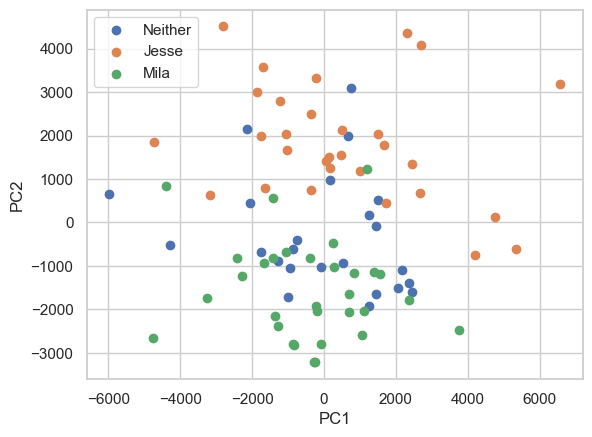

In [82]:
pca_extractor = PCAFeatureExtractor(n_components=2)
pca_extractor.fit(train_X_flat)
scatter = pca_extractor.transform(train_X_flat)

classes = np.unique(train_y_final)
labels = ['Neither', 'Jesse', 'Mila']
for cls, name in zip(classes, labels):
    mask = train_y_final == cls
    plt.scatter(scatter[mask, 0], scatter[mask, 1], label=name)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

### 1.2.3. Discussion

### Interpretation

Projecting the faces onto the first two principal components reveals some interesting patterns. There is a visible separation between Jesse and Mila, Jesse's images tend to cluster in the upper half of the plot while Mila's images are mostly in the lower half, particularly along PC2. This suggests that even with just two components, PCA captures some meaningful differences.

However, the "Neither" class (Michael Cera and Sarah Hyland) overlaps heavily with both Jesse and Mila. This makes sense, since Michael Cera looks similar to Jesse and Sarah Hyland looks similar to Mila — which is exactly why they were chosen for this dataset. A classifier using only these two features would likely confuse these look-alikes with their counterparts.

Overall, while two components show some discriminative power, they only explain about 38% of the total variance. Using more components for classification should improve separation, especially for distinguishing the look-alikes.

In [83]:
train_pca_features = np.array([pca_extractor.transform(x) for x in train_X_flat])
test_pca_features = np.array([pca_extractor.transform(x) for x in test_X_flat])

In [84]:
np.save(os.path.join('final_data', "final_train_pca_features.npy"), train_pca_features)
np.save(os.path.join('final_data', "final_test_pca_features.npy"), test_pca_features)

joblib.dump(pca_extractor, 'final_data/pca_extractor.pkl')

['final_data/pca_extractor.pkl']

# 2. Evaluation Metrics
## 2.0. Example: Accuracy
As example metric we take the accuracy. Informally, accuracy is the proportion of correct predictions over the total amount of predictions. It is used a lot in classification but it certainly has its disadvantages...

In [85]:
from sklearn.metrics import accuracy_score, classification_report

# 3. Classifiers
## 3.0. Baseline: The Random Classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [86]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed 
    during training."""
    
    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y. 

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """
        
        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self
        
    def predict(self, X):
        """Samples labels for the input data. 

        Parameters
        ----------
        X : tensor
            dataset
            
        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)
    
    def __call__(self, X):
        return self.predict(X)
    

## 3.1 Placeholder to add relevant classifiers

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  

Load data for experiments:

In [87]:
# Load labels
train_y = np.load(os.path.join('final_data', "final_train_labels.npy"))

# Load features
train_X_hog = np.load(os.path.join('final_data', "final_train_hog_features.npy"))
test_X_hog  = np.load(os.path.join('final_data', "final_test_hog_features.npy"))

train_X_pca = np.load(os.path.join('final_data', "final_train_pca_features.npy"))
test_X_pca  = np.load(os.path.join('final_data', "final_test_pca_features.npy"))

# Load the processed images so we can plot them
train_X_img = train_X_final.copy()

# Pass HOG, PCA, and Images: the function splits all three using identical indices.
(X_train_hog, X_val_hog, 
 X_train_pca, X_val_pca, 
 X_train_img, X_val_img, 
 y_train, y_val) = get_train_val_split(
    train_X_hog, 
    train_X_pca,
    train_X_img, 
    labels=train_y, 
    test_size=0.15, 
    random_state=42,
    verbose=True  
)

get_train_val_split:
  Total samples  : 85
  Training       : 72
  Validation     : 13
  Train dist     : {np.int64(0): np.int64(20), np.int64(1): np.int64(26), np.int64(2): np.int64(26)}
  Val   dist     : {np.int64(0): np.int64(4), np.int64(1): np.int64(4), np.int64(2): np.int64(5)}


## 4.0. Baseline: Random Classifier
The basic pipeline takes any input and samples a label based on the class label distribution of the training set. As expected the performance is very poor, predicting approximately 1/4 correctly on the training set. There is a lot of room for improvement but this is left to you ;). 

In [88]:
feature_extractor = IdentityFeatureExtractor() 
classifier = RandomClassificationModel()

# HOG
# train the model on the features
classifier.fit(feature_extractor(train_X_hog), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

# evaluate performance of the model on the training set
train_y_star = model(train_X_hog)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

'The performance on the training set is 0.31. This however, does not tell us much about the actual performance (generalisability).'

In [89]:
# PCA
# train the model on the features
classifier.fit(feature_extractor(train_X_pca), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

# evaluate performance of the model on the training set
train_y_star = model(train_X_pca)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

'The performance on the training set is 0.31. This however, does not tell us much about the actual performance (generalisability).'

## 4.1 Benchmark classifiers

In [90]:
from sklearn.base import clone
from sklearn.model_selection import cross_validate, StratifiedKFold

from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from xgboost import XGBClassifier

import warnings

# Filter out the specific deprecation warning from pkg_resources
warnings.filterwarnings("ignore", category=UserWarning, module='pkg_resources')
# Also common to ignore general DeprecationWarnings during benchmarks
warnings.filterwarnings("ignore", category=DeprecationWarning)

# ==========================================
# 1. Define the Benchmark Dictionary
# ==========================================
models = {
    "Linear SVM": LinearSVC(max_iter=10000, random_state=42),
    "RBF SVM": SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=10000, random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5, weights='distance'),
    "LDA (Fisherfaces)": LDA(),
    "Gaussian Process": GaussianProcessClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "Neural Net (MLP)": MLPClassifier(hidden_layer_sizes=(128,), max_iter=1000, random_state=42),
}

# Note: Because CV does the splitting for us, we pass the ENTIRE training arrays,
# not the pre-split X_train/X_val subsets.
datasets = {
    "HOG": train_X_hog,
    "PCA": train_X_pca
}

# Set up the Cross-Validation strategy (5 folds, keeping class balance)
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ==========================================
# 2. Run the Benchmark Loop
# ==========================================
print("\nStarting 5-Fold CV Benchmark (HOG vs PCA)...")
results = []

# Assuming train_y is your full label array loaded earlier
y_full = train_y 

for feature_name, X_full in datasets.items():
    
    for model_name, base_model in models.items():
        
        # cross_validate handles the cloning internally, but we clone just to be safe
        model = clone(base_model)
        
        try:
            # Run the 5-fold cross validation
            cv_results = cross_validate(
                estimator=model,
                X=X_full,
                y=y_full,
                cv=cv_strategy,
                scoring='accuracy',
                return_train_score=False,
                n_jobs=-1 # Use all CPU cores for speed
            )
            
            # Calculate means and standard deviations across the 5 folds
            mean_acc = np.mean(cv_results['test_score'])
            std_acc = np.std(cv_results['test_score'])
            mean_fit_time = np.mean(cv_results['fit_time'])
            mean_pred_time = np.mean(cv_results['score_time'])
            
            results.append({
                "Feature Set": feature_name,
                "Model": model_name,
                "Accuracy (%)": round(mean_acc * 100, 2),
                "Stability (±%)": round(std_acc * 100, 2),
                "Avg Train Time (s)": round(mean_fit_time, 4),
                "Avg Predict Time (s)": round(mean_pred_time, 4)
            })
            
        except Exception as e:
            print(f"     [!] {model_name} failed on {feature_name}: {str(e).split()[0]}...")
            continue # Skip to the next model if this one crashes

# ==========================================
# 3. Display the Leaderboard
# ==========================================
print("\n" + "="*95)
print("🏆 5-FOLD CV BENCHMARK RESULTS 🏆")
print("="*95)

# Convert to Pandas DataFrame and sort by Accuracy
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by=["Accuracy (%)", "Stability (±%)"], ascending=[False, True]).reset_index(drop=True)

print(results_df.to_string())
print("="*95)


Starting 5-Fold CV Benchmark (HOG vs PCA)...

🏆 5-FOLD CV BENCHMARK RESULTS 🏆
   Feature Set                Model  Accuracy (%)  Stability (±%)  Avg Train Time (s)  Avg Predict Time (s)
0          HOG     Neural Net (MLP)         87.06            5.76              0.3348                0.0011
1          HOG           Linear SVM         87.06            6.86              0.0780                0.0010
2          HOG  Logistic Regression         85.88            6.00              0.0290                0.0006
3          HOG     Gaussian Process         84.71            7.06              0.0202                0.0060
4          HOG              RBF SVM         83.53            4.40              0.0054                0.0021
5          HOG  K-Nearest Neighbors         83.53            8.65              0.0006                0.0227
6          HOG    LDA (Fisherfaces)         80.00           10.91              0.0128                0.0006
7          HOG        Random Forest         78.82        

## 4.2 HOG vs PCA using LinearSVM

Training Linear SVM on HOG features...
Training Linear SVM on PCA features...


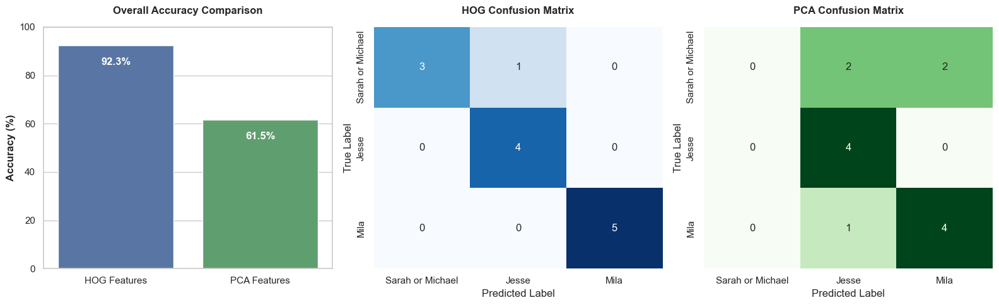


Plotting validation images for HOG predictions...


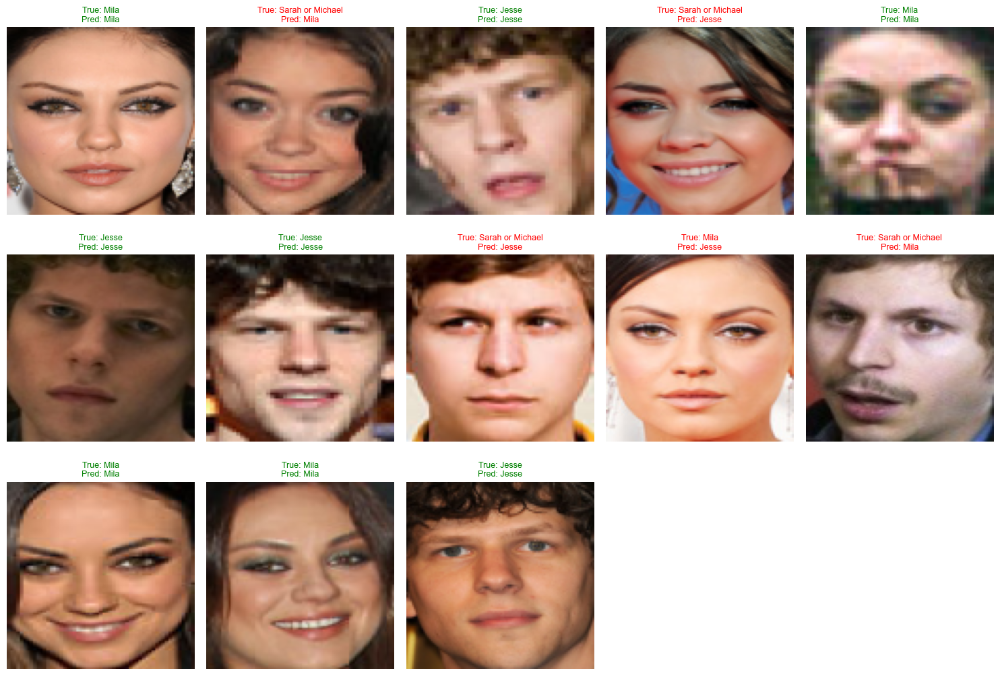

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.base import clone

# Assuming X_train_hog, X_val_hog, X_train_pca, X_val_pca, y_train, y_val are loaded
target_names = ['Sarah or Michael', 'Jesse', 'Mila']

# ==========================================
# 1. Train and Predict on HOG
# ==========================================
print("Training Linear SVM on HOG features...")
model_hog = LinearSVC(max_iter=10000, random_state=42)
model_hog.fit(X_train_hog, y_train)
y_val_pred_hog = model_hog.predict(X_val_hog)
acc_hog = accuracy_score(y_val, y_val_pred_hog)

# ==========================================
# 2. Train and Predict on PCA
# ==========================================
print("Training Linear SVM on PCA features...")
model_pca = clone(model_hog) # Clone to ensure a fresh, untrained model
model_pca.fit(X_train_pca, y_train)
y_val_pred_pca = model_pca.predict(X_val_pca)
acc_pca = accuracy_score(y_val, y_val_pred_pca)

# ==========================================
# 4. Generate Comparison Plots
# ==========================================
sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(16, 5))

# Plot A: Accuracy Bar Chart
# Plot A: Accuracy Bar Chart (Corrected for Seaborn v0.14+)
ax1 = plt.subplot(1, 3, 1)
feature_names = ['HOG Features', 'PCA Features']
accuracies = [acc_hog * 100, acc_pca * 100]

sns.barplot(
    x=feature_names, 
    y=accuracies, 
    hue=feature_names,  # Link colors to the x-axis categories
    palette=['#4C72B0', '#55A868'], 
    legend=False,       # Remove the redundant legend
    ax=ax1
)

ax1.set_ylim(0, 100)
ax1.set_ylabel('Accuracy (%)', fontweight='bold')
ax1.set_title('Overall Accuracy Comparison', fontweight='bold', pad=15)

# Adding the text labels on top of bars
for i, v in enumerate(accuracies):
    ax1.text(i, v - 8, f"{v:.1f}%", color='white', ha='center', fontweight='bold', fontsize=12)
# Calculate Confusion Matrices
cm_hog = confusion_matrix(y_val, y_val_pred_hog)
cm_pca = confusion_matrix(y_val, y_val_pred_pca)

# Plot B: HOG Confusion Matrix
ax2 = plt.subplot(1, 3, 2)
sns.heatmap(cm_hog, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax2)
ax2.set_title('HOG Confusion Matrix', fontweight='bold', pad=15)
ax2.set_ylabel('True Label')
ax2.set_xlabel('Predicted Label')

# Plot C: PCA Confusion Matrix
ax3 = plt.subplot(1, 3, 3)
sns.heatmap(cm_pca, annot=True, fmt='d', cmap='Greens', cbar=False,
            xticklabels=target_names, yticklabels=target_names, ax=ax3)
ax3.set_title('PCA Confusion Matrix', fontweight='bold', pad=15)
ax3.set_ylabel('True Label')
ax3.set_xlabel('Predicted Label')

plt.tight_layout()
plt.show()

# ==========================================
# 5. Visualize Validation Predictions (Optional: Show HOG mistakes)
# ==========================================
print("\nPlotting validation images for HOG predictions...")
plot_validation_images(
    X_val_images=X_val_img, 
    y_val_true=y_val, 
    y_val_pred=y_val_pred_pca,  # Change to y_val_pred_pca to see PCA mistakes
    class_names=target_names
)

## 4.3 Neural Network

Moving to a Deep Learning Convolutional Neural Network (CNN) is the ultimate step for computer vision. However, we have to address the "Small Data" reality: if you try to train a CNN from scratch on just 85 images, it will completely memorize your training set (overfit) and fail on the validation set.

To get around this, we use Transfer Learning. Instead of extracting hand-crafted HOG features, we will pass your images through a massive Neural Network (like MobileNetV2 by Google) that has already been trained on millions of images. We will freeze its "brain" so it acts as an ultimate feature extractor, and only train a tiny new classification layer on top for your 3 specific people.

TODO: Improve the model. One easy fix:
Increase Resolution: Move from $100 \times 100$ to $128 \times 128$ or $224 \times 224$. MobileNetV2 was designed for $224 \times 224$. Higher resolution allows the model to see the fine texture of the iris and skin, which are key identity markers.


Preprocess raw images and labels...
Original image data shape: (85, 100, 100, 3)
Original label data shape: (85,)
get_train_val_split:
  Total samples  : 85
  Training       : 72
  Validation     : 13
  Train dist     : {np.int64(0): np.int64(20), np.int64(1): np.int64(26), np.int64(2): np.int64(26)}
  Val   dist     : {np.int64(0): np.int64(4), np.int64(1): np.int64(4), np.int64(2): np.int64(5)}

Starting 5-Fold Cross-Validation...

--- Training Fold 1 ---


/var/folders/97/zk1xw9z96qs6z74fz8w0kzl80000gp/T/ipykernel_83691/1941945196.py:38: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


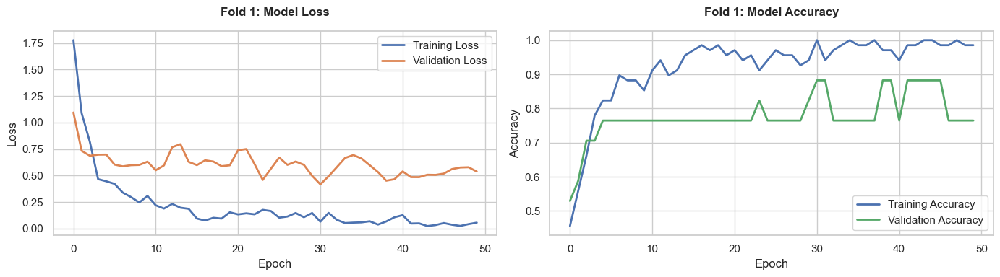

-> Fold 1 Final Accuracy: 76.47%


--- Training Fold 2 ---


/var/folders/97/zk1xw9z96qs6z74fz8w0kzl80000gp/T/ipykernel_83691/1941945196.py:38: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


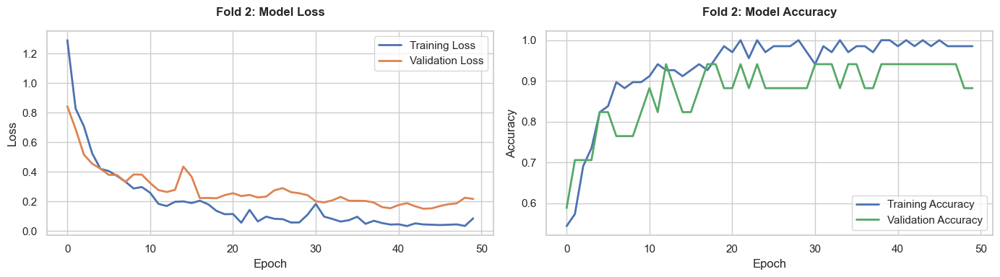

-> Fold 2 Final Accuracy: 88.24%


--- Training Fold 3 ---


/var/folders/97/zk1xw9z96qs6z74fz8w0kzl80000gp/T/ipykernel_83691/1941945196.py:38: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


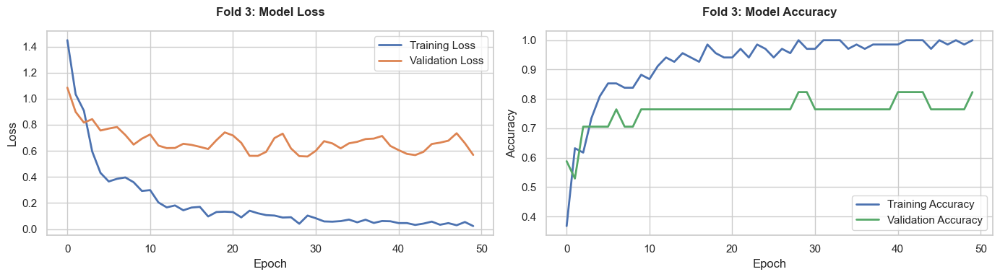

-> Fold 3 Final Accuracy: 82.35%


--- Training Fold 4 ---


/var/folders/97/zk1xw9z96qs6z74fz8w0kzl80000gp/T/ipykernel_83691/1941945196.py:38: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


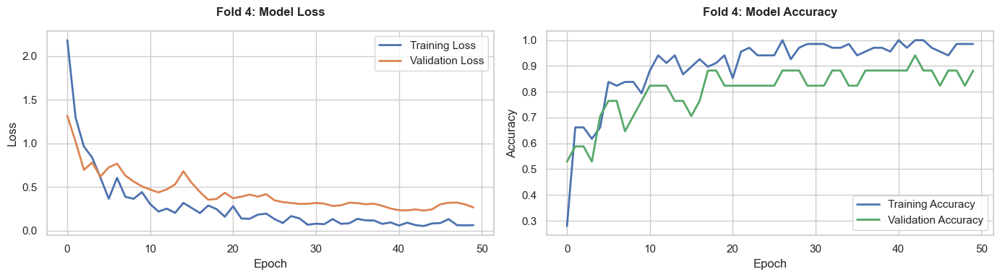

-> Fold 4 Final Accuracy: 88.24%


--- Training Fold 5 ---


/var/folders/97/zk1xw9z96qs6z74fz8w0kzl80000gp/T/ipykernel_83691/1941945196.py:38: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


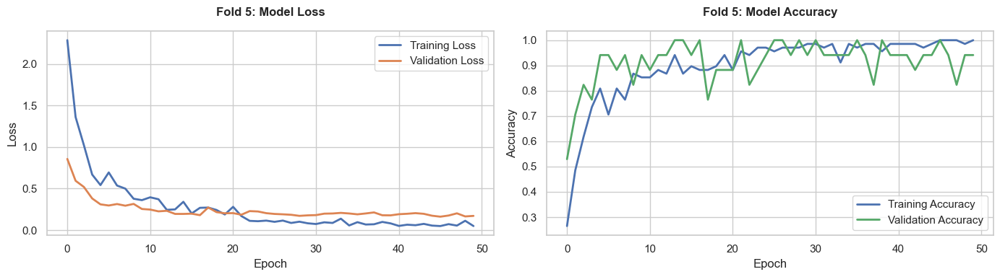

-> Fold 5 Final Accuracy: 94.12%


🏆 NEURAL NETWORK CV RESULTS 🏆
Robust Accuracy: 85.88% (± 6.00%)


In [92]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tqdm.keras import TqdmCallback
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# 1. Preprocess for the Neural Net
# ==========================================
print("Preprocess raw images and labels...")
# Assuming your images are saved as a numpy array of shape (N, 64, 64, 3)
print(f"Original image data shape: {train_X_img.shape}")
print(f"Original label data shape: {train_y.shape}")

# Neural Networks expect pixel values between -1 and 1, or 0 and 1.
# MobileNetV2 has a specific preprocessing function we must use:
X_preprocessed = tf.keras.applications.mobilenet_v2.preprocess_input(train_X_img.astype(np.float32))

# Split the data using your custom function from earlier
X_train_nn, X_val_nn, y_train_nn, y_val_nn = get_train_val_split(
    X_preprocessed, 
    labels=train_y, 
    test_size=0.15, 
    random_state=42
)

# ==========================================
# 2. Define a Model Building Function
# ==========================================
# CRITICAL: We must wrap the model architecture in a function. 
# We need to call this to generate a brand new, "amnesiac" model for each fold.
def build_model():
    base_model = MobileNetV2(
        input_shape=(100, 100, 3), 
        include_top=False, 
        weights='imagenet'
    )
    base_model.trainable = False
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(3, activation='softmax')(x)
    
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# ==========================================
# 3. Run the 5-Fold Cross Validation Loop
# ==========================================
print("\nStarting 5-Fold Cross-Validation...")

# Use StratifiedKFold to ensure each fold has an equal mix of Sarah/Jesse/Mila
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold_no = 1
cv_accuracies = []

# We run this on the FULL preprocessed dataset, let KFold do the splitting
for train_index, val_index in skf.split(X_preprocessed, train_y):
    print(f"\n--- Training Fold {fold_no} ---")
    
    # 1. Split the data for this specific fold
    X_train_fold = X_preprocessed[train_index]
    y_train_fold = train_y[train_index]
    X_val_fold = X_preprocessed[val_index]
    y_val_fold = train_y[val_index]
    
    # 2. Build a fresh model
    # tf.keras.backend.clear_session() helps free up Mac memory between folds
    tf.keras.backend.clear_session() 
    model_cv = build_model()
    
    # 3. Train the model (silently to keep output clean, but saving the history!)
    history = model_cv.fit(
        X_train_fold, y_train_fold,
        epochs=50,
        batch_size=16,
        validation_data=(X_val_fold, y_val_fold), # Added validation data here so history tracks it
        verbose=0
    )
    
    # 3.5. Visualize Training History for this Fold
    sns.set_theme(style="whitegrid")
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

    # Plot 1: Training vs. Validation Loss
    ax1.plot(history.history['loss'], label='Training Loss', color='#4C72B0', linewidth=2)
    ax1.plot(history.history['val_loss'], label='Validation Loss', color='#DD8452', linewidth=2)
    ax1.set_title(f'Fold {fold_no}: Model Loss', fontweight='bold', pad=15)
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend(loc='upper right')

    # Plot 2: Training vs. Validation Accuracy
    ax2.plot(history.history['accuracy'], label='Training Accuracy', color='#4C72B0', linewidth=2)
    ax2.plot(history.history['val_accuracy'], label='Validation Accuracy', color='#55A868', linewidth=2)
    ax2.set_title(f'Fold {fold_no}: Model Accuracy', fontweight='bold', pad=15)
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend(loc='lower right')

    plt.tight_layout()
    plt.show()
    
    # 4. Evaluate on the validation fold
    y_pred_probs = model_cv.predict(X_val_fold, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    
    fold_acc = accuracy_score(y_val_fold, y_pred)
    cv_accuracies.append(fold_acc)
    print(f"-> Fold {fold_no} Final Accuracy: {fold_acc * 100:.2f}%\n")
    
    fold_no += 1

# ==========================================
# 4. Final CV Results
# ==========================================
print("\n" + "="*45)
print("🏆 NEURAL NETWORK CV RESULTS 🏆")
print("="*45)
mean_acc = np.mean(cv_accuracies) * 100
std_acc = np.std(cv_accuracies) * 100
print(f"Robust Accuracy: {mean_acc:.2f}% (± {std_acc:.2f}%)")
print("="*45)

# 5. Publishing best results

In [93]:
submission = test.copy().drop('img', axis = 1)
submission['class'] = test_y_star

submission

NameError: name 'test_y_star' is not defined

In [ ]:
submission.to_csv('submission.csv')

# 6. Discussion
...

In summary we contributed the following: 
* 
